# <font color= 'blue'>Blind Source Separation</font>
## Independent Component Analysis


***
___Required Packages:___ Python(2.7+), NumPy, SciPy Toolkit, Matplotlib
***
In this tutorial we will learn how to solve the Cocktail Party Problem using Independent Component Analysis(ICA).


# Overview
## The Cocktail Party Problem(CPP)

So what is the Cocktail Party Problem? 
Imagine you are at a party where a lot of different conversations are happening in different parts of the room. As a listener in  the room, you are receiving sound from all of these conversations at the same time. And yet, as humans, we possess the ability to identify different threads of conversation and to focus on any conversation of our choice. How do we do that? And how can we program a computer to do that?
So this is essentially the Cocktail Party Problem: Given **m** sources(conversations at the party for example), and some number of sound receivers, separate out the different signals. (We will talk about how many receivers we need later.)

We need to make some mathematical assumptions and also phrase the problem more formally.

### The data

So first of all, our signals here are the sounds coming from different sources. 
At every (uniformly spaced) discrete interval of time we record **m** samples, one at each of our **m** microphones.

Note the implicit assumptions that we have made here:

**1)** There are as many microphoneses as there are independent conversations(sources) going on in the room. This assumption allows us to come up with a method to retrieve all the m independent signals. We can say that our system is **critically determined**(and is not under- or over- determined). Henceforth, we shall only consider this case in the tutorial.

**2)** Each microphone records a reasonably distinct combination of the independent signals. This simply amounts to not keeping two microphones too close to each other. Due to practical computational limits (see floating point math), it is always best to have easily distinguishable recordings. 

How are we recording this data? We simply record the amplitude of the sound at each instant. Recording the pressure amplitude is a convenient thing to do(and is what a microphone does. A transducer then converts the pressure amplitude to a voltage).
Note that we are recording the signals at discrete intervals of time (at a rate assumed to be greater than the Shannon Sampling rate)and will be working only in the time domain with these discrete signals.

One very important thing: We assume that the sound that any receiver records is a **linear combination** of sounds from the different sources. This is a reasonable assumption to make as pressure adds linearly. Each receiver will receive a different linear combination: If the first receiver is closer to a particular speaker than the second receiver, then the linear weight of this speaker will be proportionately higher for the first receiver.

![Cocktail Party Problem](Notebook/cocktail_1.png)

We further assume that each source is **statistically independent** with respect to all the other sources. We will look at a mathematical interpretation of statistical independence of two signals later. Within the context of the Cocktail Party parable an intuitive understanding of this assumption follows naturally, as the conversations happening in different parts of the room are independent of each other. Hence, knowing the signal at a particular instant from one source does not allow us to predict the value of the signal from any other source at that instant. They are independent variables.

This is the key assumption in Blind Source separation that allows to solve the problem.

We are also making one vital assumption about the sources of the signals: that they are non-Gaussian. We will look at what that means and why it matters in the section on Statistical Independence.



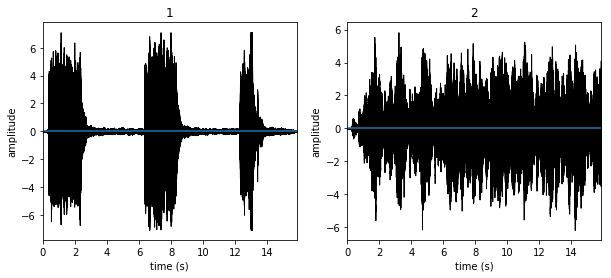

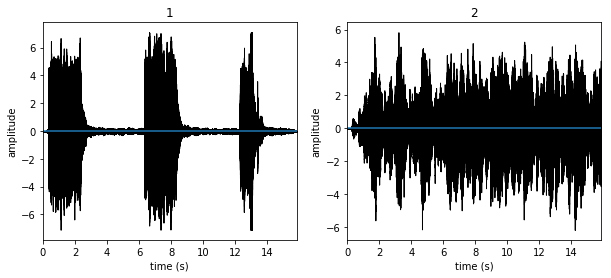

In [3]:
from scipy.io import wavfile
from FastICA import FastICA
from FOBI import FOBI
import utilities as utl
import numpy as np

# Specify the name
name = ["X", "Y"]

#specifing epsilon(upper bound to the error)
eps = 0.00000001

# Read the mixed signals
rate1, data1 = wavfile.read('./sounds/mixed' + name[0] + '.wav')
rate2, data2 = wavfile.read('./sounds/mixed' + name[1] + '.wav')

# Centering the mixed signals and scaling the values as well
data1 = data1 - np.mean(data1)
data1 = data1/32768
data2 = data2 - np.mean(data2)
data2 = data2/32768

# Creating a matrix out of the signals
signals = [data1, data2]
matrix = np.vstack(signals)

# Whitening the matrix as a pre-processing step
whiteMatrix = utl.whitenMatrix(matrix)

X = whiteMatrix

# Find the individual components one by one
vectors = []
for i in range(0, X.shape[0]):
	# The FastICA function is used as is from FastICA_image.py, and the it works out of the box
	vector = FastICA(X, vectors, eps)
	vectors.append(vector)

# Stack the vectors to form the unmixing matrix
W = np.vstack(vectors)

# Get the original matrix
S = np.dot(W, whiteMatrix)

# Unmixing matrix through FOBI
fobiW = FOBI(X)

# Get the original matrix using fobiW
fobiS = np.dot(fobiW.T, whiteMatrix)

# Plot the separated sound signals
utl.plotSounds([S[0], S[1]], ["1", "2"], rate1, "Ring_StarWars_separated")

# Write the separated sound signals, 5000 is multiplied so that signal is audible
wavfile.write("./sounds/FastICAseparate" + name[0] + ".wav", rate1, 5000*S[0].astype(np.int16))
wavfile.write("./sounds/FastICAseparate" + name[1] + ".wav", rate1, 5000*S[1].astype(np.int16))

# Plot the separated sound signals
utl.plotSounds([fobiS[1], fobiS[0]], ["1", "2"], rate1, "Ring_StarWars_separated_FOBI")

# Write the separated sound signals, 5000 is multiplied so that signal is audible
wavfile.write("./sounds/FOBIseparate" + name[0] + ".wav", rate1, 5000*fobiS[1].astype(np.int16))
wavfile.write("./sounds/FOBIseparate" + name[1] + ".wav", rate1, 5000*fobiS[0].astype(np.int16))


In [4]:
from IPython.display import Audio

In [5]:
print('Original Signal 1')
Audio("sounds/sourceX.wav")

Original Signal 1


In [7]:
print('Original Signal 2')
Audio("sounds/sourceY.wav")

Original Signal 2


In [8]:
print('Mixed Signal 1')
Audio("sounds/mixedX.wav")

Mixed Signal 1


In [9]:
print('Mixed Signal 2')
Audio("sounds/mixedY.wav")

Mixed Signal 2


In [10]:
print('FastICA Separate Signal 1')
Audio("sounds/FastICAseparateX.wav")

FastICA Separate Signal 1


In [11]:
print('FastICA Separate Signal 2')
Audio("sounds/FastICAseparateY.wav")

FastICA Separate Signal 2


In [12]:
print('FOBI Separate Signal 1')
Audio("sounds/FOBIseparateX.wav")

FOBI Separate Signal 1


In [13]:
print('FOBI Separate Signal 2')
Audio("sounds/FOBIseparateY.wav")

FOBI Separate Signal 2
